# HM-OT synth example

## imports

In [3]:
import os
import pandas as pd
import scanpy as sc
import numpy as np
import torch
import sys
from scipy.spatial.distance import cdist
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.cluster import KMeans
import sys
import importlib
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
sys.path.append(os.path.abspath(".."))

import src.FRLC as FRLC
import src.FRLC.FRLC_multimarginal as FRLC_multimarginal
import src.HiddenMarkovOT as HiddenMarkovOT
import src.utils.clustering as clustering
import src.utils.util_LR as util_LR
import src.utils.util_zf as util_zf
from src.utils.util_LR import convert_adata
import src.plotting as plotting

## reload

In [5]:
importlib.reload(clustering)
importlib.reload(util_LR)
importlib.reload(util_zf)
importlib.reload(HiddenMarkovOT)
importlib.reload(plotting)

<module 'src.plotting' from '/home/ph3641/HMOT/src/plotting.py'>

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'On device: {device}')
dtype = torch.float32

On device: cuda


## make synthetic data: >2 timepoints

In [7]:
import numpy as np
import torch

device, dtype = "cpu", torch.float32          # set these as you do elsewhere

# ────────────────────────────────────────────────────────────────────────────────
#  How many points per cluster?
#  (Everything still sums to 999 points per time-step so the proportions logic
#   you had before stays intact.)
# ────────────────────────────────────────────────────────────────────────────────
proportions = [
    np.array([333, 333, 333]),                                  # t = 0  (3)
    np.array([167, 166, 167, 167, 166, 166]),                   # t = 1  (6)
    np.array([167, 166, 167, 167, 166, 166]),                   # t = 2  (6)
]
proportions_tens = [torch.from_numpy(p).type(dtype).to(device) / 999.0
                    for p in proportions]

# ────────────────────────────────────────────────────────────────────────────────
def generate_branching_blobs(
    n_per_cluster=(
        [333, 333, 333],                      # 3 clusters
        [167, 166, 167, 167, 166, 166],       # 6 clusters
        [167, 166, 167, 167, 166, 166],       # 6 clusters
    ),
    std=0.6,
    random_seed=0,
):
    rng = np.random.default_rng(random_seed)

    centres = {
        0: (0.05*np.array([[-1,  1], [-1, -2],  [1, 0]])),              # ids 0,1,2
        1: 0.5*np.array([                                           # ids 3–8
            [-2, 3], [-3, 2],   # ← children of id 0
            [-1, -4], [-2, -3],    # ← children of id 1
            [3, 1],  [3, -1],    # ← children of id 2
        ]),
        2: 0.5*np.array([                                           # ids 3–8 persist
            [-3, 4], [-5, 2],
            [-1, -5], [-4, -3],
            [4, 2],  [4, -2],
        ]),
    }

    # Mapping: which global cluster-ID does the k-th blob at time-t get?
    cluster_ids = {
        0: [0, 1, 2],
        1: [3, 4, 5, 6, 7, 8],
        2: [3, 4, 5, 6, 7, 8],      # same six persist
    }

    # Optional lineage dict (parent → children) in case you still need it
    lineage = {
        0: {0: [3, 4], 1: [5, 6], 2: [7, 8]},   # t0 ➜ t1 branching
        1: {3: [3], 4: [4], 5: [5], 6: [6], 7: [7], 8: [8]},  # persistence
    }

    # ------------------------------------------------------------------
    X_parts, t_parts, c_parts = [], [], []

    for t, counts in enumerate(n_per_cluster):
        blobs = [rng.normal(loc=centres[t][k], scale=std, size=(counts[k], 2))
                 for k in range(len(counts))]
        X_parts.append(np.vstack(blobs))

        t_parts.append(np.full(sum(counts), t, dtype=int))

        c_parts.append(
            np.concatenate([
                np.full(counts[k], cluster_ids[t][k], dtype=int)
                for k in range(len(counts))
            ])
        )

    X              = np.vstack(X_parts)
    time_labels    = np.concatenate(t_parts)
    cluster_labels = np.concatenate(c_parts)
    return X, time_labels, cluster_labels, lineage

In [8]:
### set params

FIGSIZE = 16
random_state = 42
n_timepoints = 3
std=0.3

In [9]:
X, time_labels, cluster_labels, lineage = generate_branching_blobs(std=std,
                                                                   random_seed=random_state)

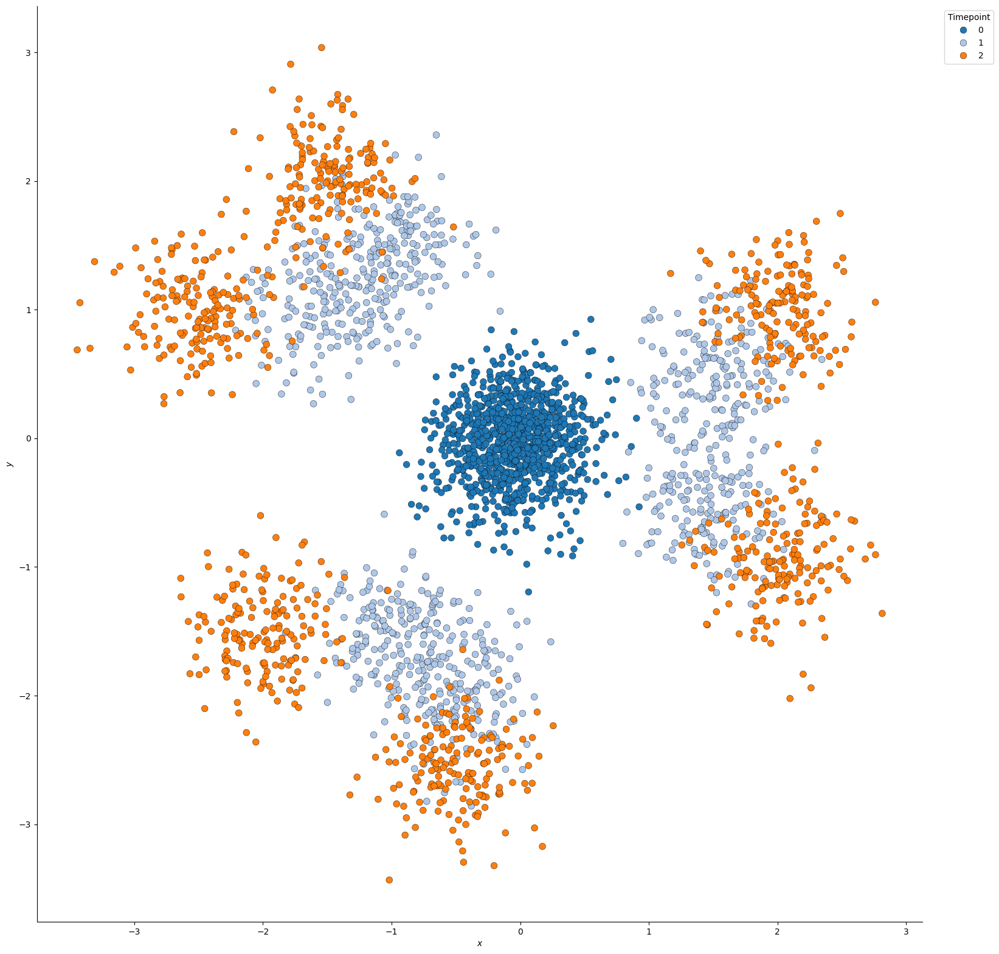

In [10]:
df = pd.DataFrame({
    "x": X[:, 0],
    "y": X[:, 1],
    "timepoint": time_labels
})

palette = sns.color_palette("tab20", n_colors=df["timepoint"].nunique())

fig, ax = plt.subplots(figsize=(FIGSIZE, FIGSIZE))
sns.scatterplot(
    data=df,
    x="x", y="y",
    hue="timepoint",
    palette=palette,
    s=60,
    linewidth=0.3, edgecolor="k",
    ax=ax
)

ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$x$")
ax.set_ylabel(r"$y$")
ax.legend(title="Timepoint", bbox_to_anchor=(1.02, 1), loc="upper left")
sns.despine()
plt.tight_layout()
plt.show()

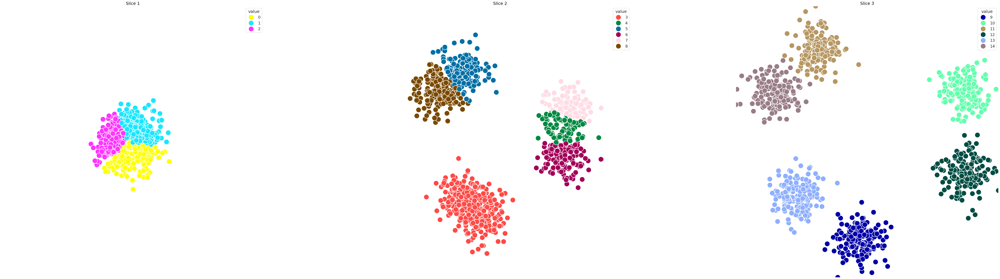

In [11]:
X1 = X[time_labels == 0]
X2 = X[time_labels == 1]
X3 = X[time_labels == 2]

kmeans1 = kmeans = KMeans(n_clusters=3,
                          random_state=random_state)
kmeans2 = kmeans = KMeans(n_clusters=6,
                          random_state=random_state)
kmeans3 = kmeans = KMeans(n_clusters=6,
                          random_state=random_state)

klabels1_ = kmeans1.fit_predict(X1)
klabels2_ = kmeans2.fit_predict(X2)
klabels3_ = kmeans3.fit_predict(X3)

klabels1 = klabels1_
klabels2 = klabels2_ + len(set(klabels1))
klabels3 = klabels3_ + len(set(klabels1)) + len(set(klabels2))

Q1_ann = np.eye(len(set(klabels1_)))[klabels1_]
Q2_ann = np.eye(len(set(klabels2_)))[klabels2_]
Q3_ann = np.eye(len(set(klabels3_)))[klabels3_]
Qs_ann = [Q1_ann, Q2_ann, Q3_ann]

Ss = [X1, X2, X3]
cell_type_labels = np.concatenate([klabels1, klabels2, klabels3])

Ts = [None, None, None]
plotting.plot_clusters_from_QT(Ss, Qs_ann, Ts, dotsize=500)

In [12]:

C_factors_sequence = []

for timepoint in range(2):
    tp1 = X[time_labels == timepoint]
    tp2 = X[time_labels == timepoint+1]
    _X1 = torch.from_numpy(tp1).type(torch.DoubleTensor).to(device)
    _X2 = torch.from_numpy(tp2).type(torch.DoubleTensor).to(device)
    C12 = torch.cdist(_X1, _X2).to(device)
    C12 = C12.to(dtype)
    I = torch.eye(C12.shape[1]).to(dtype).to(device)
    C_factors_sequence.append(( C12, I ))



In [15]:
rank_list = [(3,6), (6,6)]
iter = 15
gamma = 80.0
alpha = 0.0
tau_in = 1e5

hmot = HiddenMarkovOT.HM_OT(rank_list = rank_list,
                            max_iter = iter,
                            min_iter = iter,
                            device=device,
                            alpha = alpha,
                            gamma = gamma,
                            dtype = dtype,
                            printCost = False,
                            returnFull = False,
                            initialization = 'Full',
                            tau_in = tau_in,
                            proportions=proportions_tens,
                            )

A_factors_sequence = [None] * (n_timepoints)
hmot.gamma_smoothing(C_factors_sequence,
                    A_factors_sequence)


Iteration: 0
Iteration: 0
Iteration: 0
Ranks: r1 3, r2 6, r3 6
Iteration: 0
Iteration: 0
Iteration: 0


In [16]:
Qs = hmot.Q_gammas
Ts = hmot.T_gammas

Qs_np = [Q.cpu().detach().numpy() for Q in Qs]
Ts_np = [T.cpu().detach().numpy() for T in Ts]

In [17]:
print("cluster_labels.shape:", cluster_labels.shape)

cluster_labels.shape: (2997,)


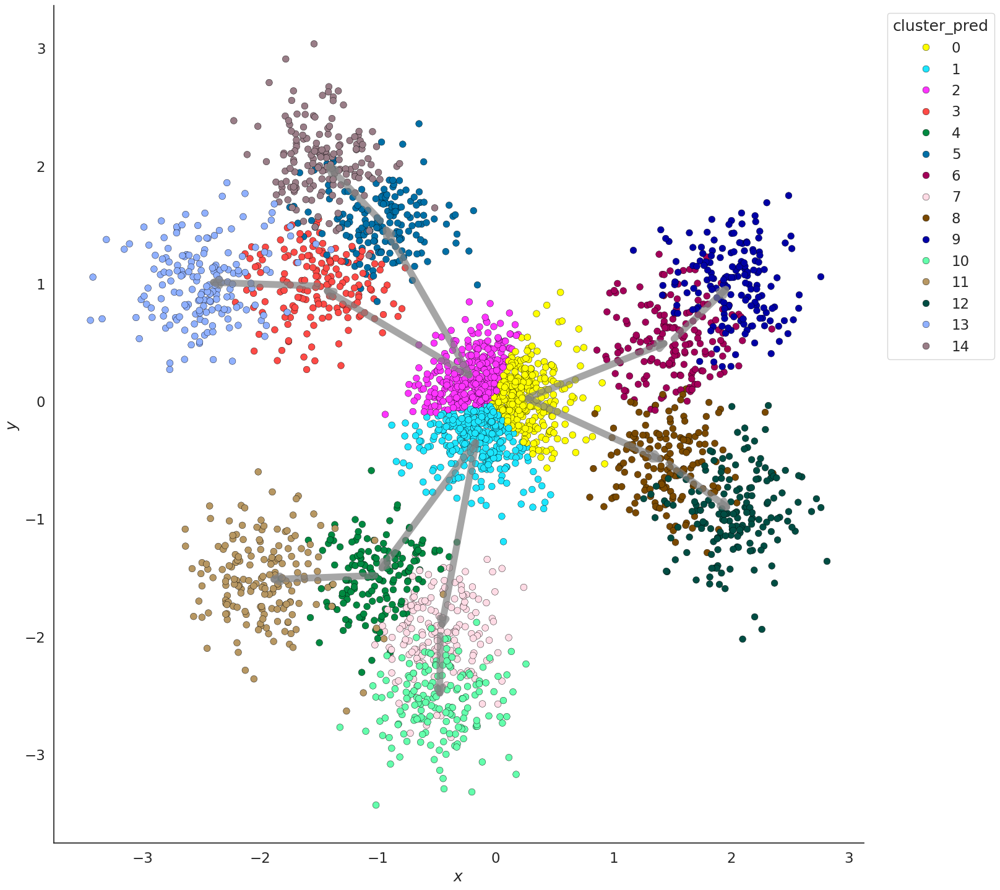

In [18]:
import numpy as np

fig, ax = plotting.plot_diffmap_clusters(
    X,                   # your (N×2) point‐cloud 
    time_labels,         # length-N array of 0,1,2…
    Qs_np,               # list of factor matrices Qs_np[t]: (n_t × k_t)
    Ts_np,               # list of transition matrices Ts_np[t]: (k_t × k_{t+1})
    df,                  # your DataFrame with “x”,”y”,”timepoint” columns
)

plt.show()

In [19]:
Qs[-1].sum(axis=0)

tensor([0.1672, 0.1662, 0.1672, 0.1672, 0.1662, 0.1662])

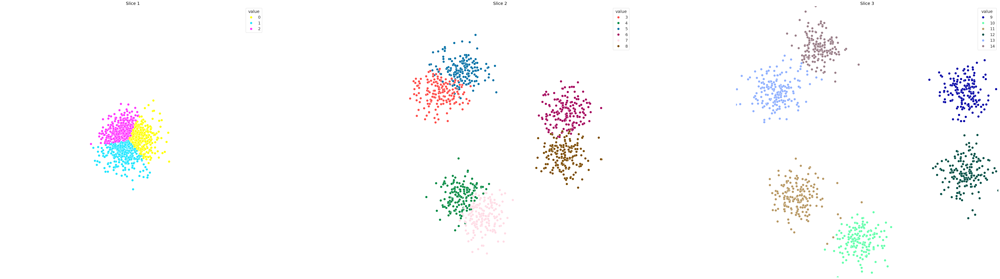

In [20]:
Qs = hmot.Q_gammas
Ts = hmot.T_gammas

Qs_np = [Q.cpu().detach().numpy() for Q in Qs]
Ts_np = [T.cpu().detach().numpy() for T in Ts]

plotting.plot_clusters_from_QT(Ss, Qs_np, Ts_np, dotsize=100, clustering_type='ml')

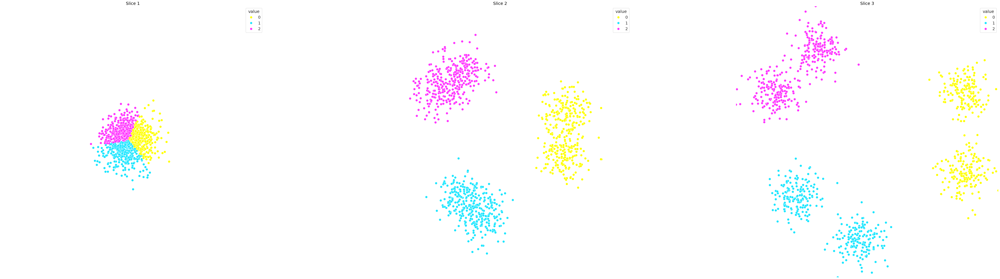

In [23]:
plotting.plot_clusters_from_QT(Ss,
                               Qs_np,
                               Ts_np,
                               dotsize=100,
                               clustering_type='reference',
                               reference_index=0)

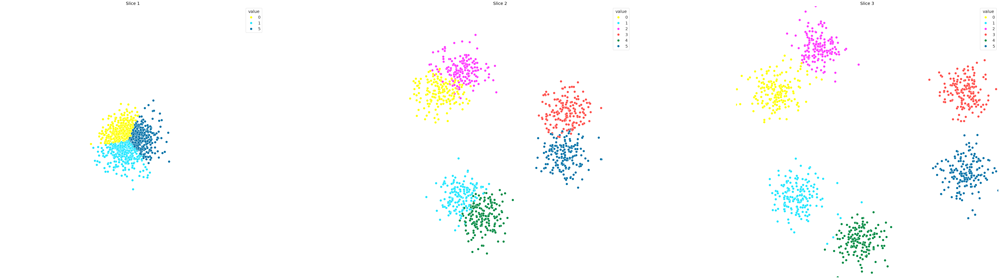

In [24]:
plotting.plot_clusters_from_QT(Ss,
                               Qs_np,
                               Ts_np,
                               dotsize=100,
                               clustering_type='reference',
                               reference_index=1)

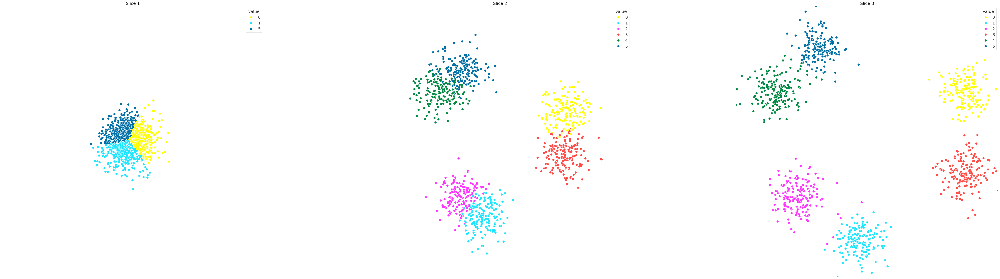

In [25]:
plotting.plot_clusters_from_QT(Ss,
                               Qs_np,
                               Ts_np,
                               dotsize=100,
                               clustering_type='reference',
                               reference_index=2)

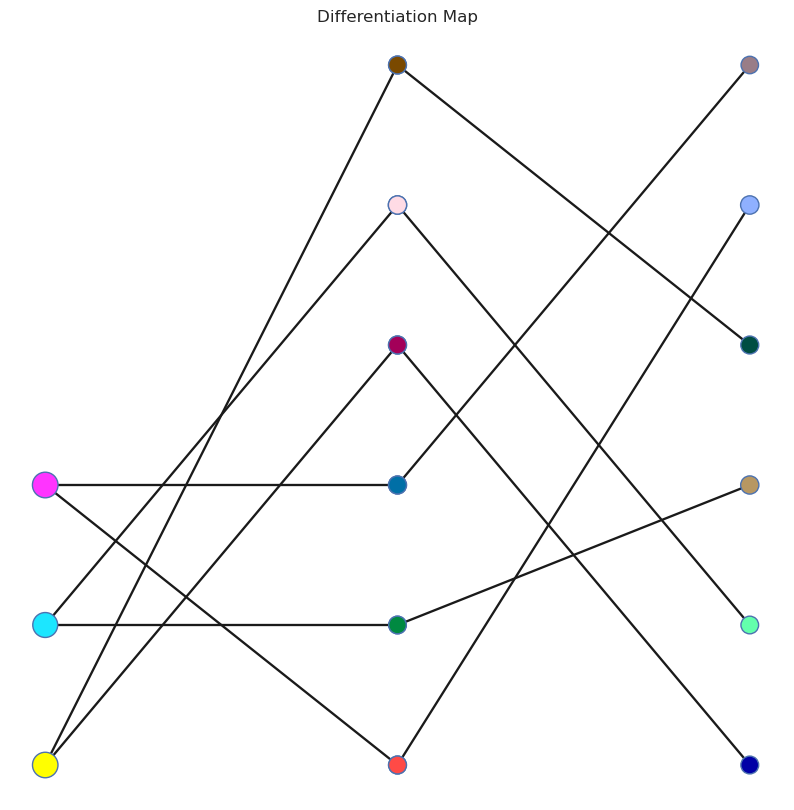

In [26]:
plotting.diffmap_from_QT(Qs_np, Ts_np)

## now run `moscot` (W-OT)

In [27]:
from anndata import AnnData

def setup_point_clouds_for_waddington_ot(point_cloud_1,
                                         point_cloud_2,
                                         time_1=0,
                                         time_2=1,
                                         ct_labels_1=None,
                                         ct_labels_2=None):
    X_combined = np.vstack([point_cloud_1, point_cloud_2])

    time_labels = np.concatenate([
        np.full(point_cloud_1.shape[0], time_1),
        np.full(point_cloud_2.shape[0], time_2)
    ])

    cell_ids = np.arange(X_combined.shape[0])

    adata = AnnData(X=X_combined)
    adata.obs['time_point'] = time_labels
    adata.obs['cell_id'] = cell_ids
    adata.obs_names = [f"cell_{i}" for i in range(X_combined.shape[0])]
    adata.var_names = ['dim_1', 'dim_2']

    if ct_labels_1 is not None and ct_labels_2 is not None:
        combined_ct_labels = np.concatenate([ct_labels_1, ct_labels_2])
        adata.obs['celltype'] = combined_ct_labels

    return adata

In [28]:
#!pip install moscot -q

In [29]:
#!pip install "jax[cuda]" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html -q

In [30]:
#!pip install diffrax -q

In [31]:
import moscot as mt
import moscot.plotting as mpl
from moscot.problems.time import TemporalProblem

In [32]:
len(klabels3)

999

In [33]:
adata_12 = setup_point_clouds_for_waddington_ot(X1,
                                                X2,
                                                ct_labels_1=klabels1,
                                                ct_labels_2=klabels2)
adata_12.obs["celltype"] = adata_12.obs["celltype"].astype("category")
adata_23 = setup_point_clouds_for_waddington_ot(X2,
                                                X3,
                                                ct_labels_1=klabels2,
                                                ct_labels_2=klabels3)
adata_23.obs["celltype"] = adata_23.obs["celltype"].astype("category")
tp_12 = mt.problems.time.TemporalProblem(adata_12)
tp_23 = mt.problems.time.TemporalProblem(adata_23)

tp_12.prepare(time_key='time_point')
tp_23.prepare(time_key='time_point')

solve_kwargs = {
    'epsilon': 0.05,
    'tau_a': 1.0,
    'tau_b': 1.0,
}

In [34]:
tp_12.solve(**solve_kwargs)

# Extract results
pi_12 = tp_12.solutions[(0, 1)].transport_matrix

INFO     Solving `1` problems                                                                                      
INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(999, 999)].                                    


In [35]:
tp_23.solve(**solve_kwargs)

# Extract results
pi_23 = tp_23.solutions[(0, 1)].transport_matrix

INFO     Solving `1` problems                                                                                      
INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(999, 999)].                                    


In [36]:
adata_12.obs['time_point']

cell_0       0
cell_1       0
cell_2       0
cell_3       0
cell_4       0
            ..
cell_1993    1
cell_1994    1
cell_1995    1
cell_1996    1
cell_1997    1
Name: time_point, Length: 1998, dtype: category
Categories (2, int64): [0, 1]

In [37]:
tp_12.cell_transition(source = 0,
                      target = 1,
                      source_groups="celltype",
                      target_groups="celltype",
                      forward=True,
                      key_added="cell_transition"
                )

tm = adata_12.uns['moscot_results']['cell_transition']["cell_transition"]['transition_matrix']

tm_ordered = tm.loc[np.unique(klabels1), np.unique(klabels2)]
T12_ = tm_ordered.to_numpy()
Q1 = Qs_ann[0] / Qs_ann[0].sum()
T12 = np.diag(np.sum(Q1, axis=0)) @ T12_

In [39]:
tp_23.cell_transition(source = 0,
                      target = 1,
                      source_groups="celltype",
                      target_groups="celltype",
                      forward=True,
                      key_added="cell_transition"
                )

tm = adata_23.uns['moscot_results']['cell_transition']["cell_transition"]['transition_matrix']

tm_ordered = tm.loc[np.unique(klabels2), np.unique(klabels3)]
T23_ = tm_ordered.to_numpy()
Q2 = Qs_ann[1] / Qs_ann[1].sum()
T23 = np.diag(np.sum(Q2, axis=0)) @ T23_

In [40]:
Q3 = Qs_ann[2] / Qs_ann[2].sum()

Qs_wot = [Q1, Q2, Q3]
Ts_wot = [T12, T23]

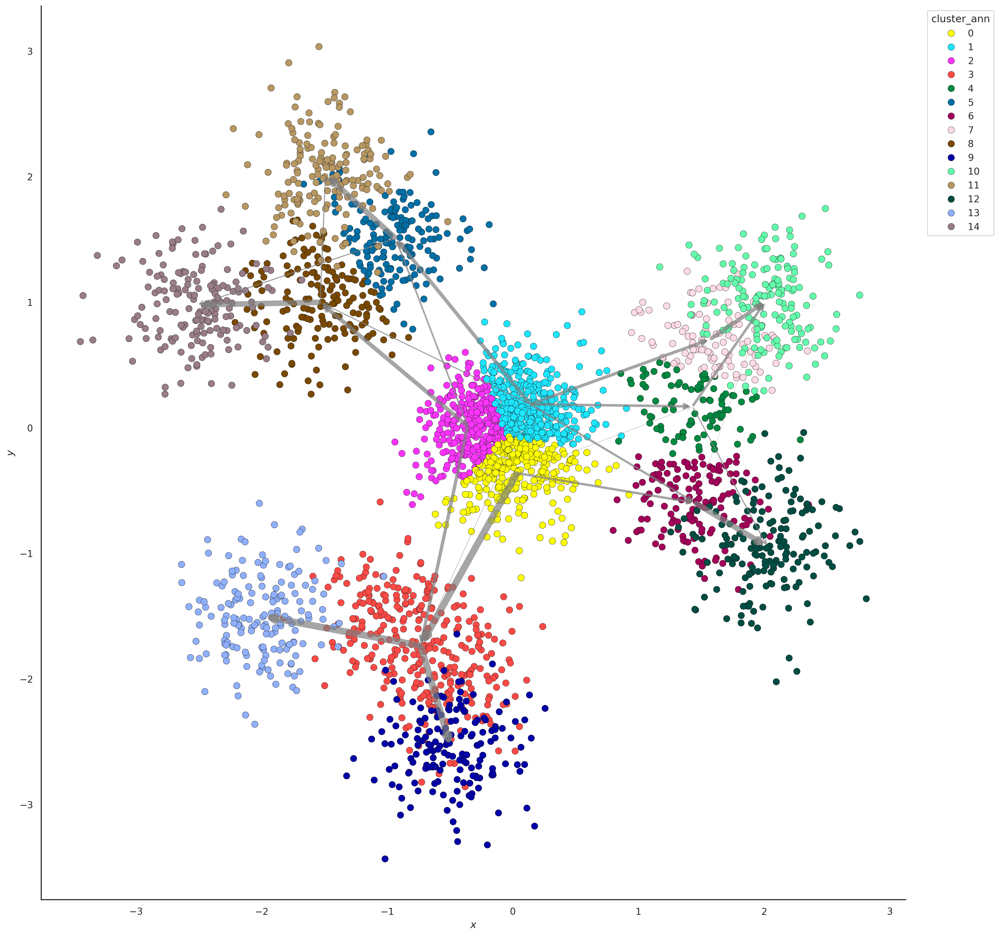

In [43]:

fig, ax = plotting.plot_diffmap_clusters(
    X,                   
    time_labels,         
    Qs_wot,
    Ts_wot,             
    df,
    cluster_key = 'cluster_ann'
)
plt.show()


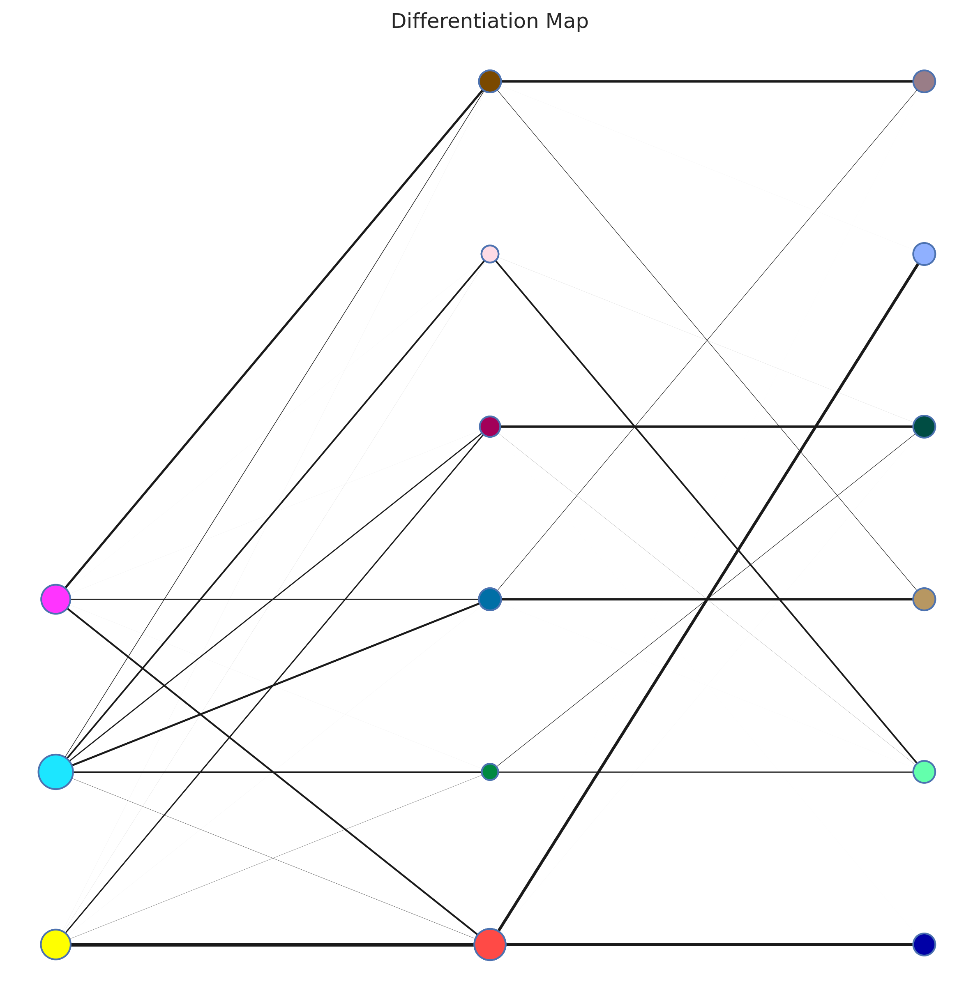

In [44]:
plotting.diffmap_from_QT(Qs_ann, Ts_wot)